In [1]:
!pip install torchinfo


[notice] A new release of pip is available: 24.0 -> 24.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [2]:
!pip install tensorflow


[notice] A new release of pip is available: 24.0 -> 24.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [3]:
# Checking if a GPU is available for training a model
from tensorflow.python.client import device_lib
device_lib.list_local_devices()

[name: "/device:CPU:0"
 device_type: "CPU"
 memory_limit: 268435456
 locality {
 }
 incarnation: 13528866798491140992
 xla_global_id: -1]

In [4]:
# Display detailed information about the system's memory
!cat /proc/meminfo

'cat' is not recognized as an internal or external command,
operable program or batch file.


In [5]:
# Display detailed information about the system's central processing unit (CPU)
!cat /proc/cpuinfo

'cat' is not recognized as an internal or external command,
operable program or batch file.


In [6]:
!pip install kaggle



[notice] A new release of pip is available: 24.0 -> 24.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [7]:
!pip install --upgrade --force-reinstall --no-deps kaggle==1.5.8
!mkdir /root/.kaggle

with open("C:\\Users\\jyoti\\OneDrive\\Desktop\\JYOTI CMU Docs\\Applications of NLX & LLM\\kaggle.json", "w+") as f:
    f.write('{"username":"jyotikhanchandani","key":"9adf973e0738e624d3fd4510daa500cc"}')
    # Put your kaggle username & key here

!chmod 600 /root/.kaggle/kaggle.json

  Using cached kaggle-1.5.8-py3-none-any.whl
  Attempting uninstall: kaggle
    Found existing installation: kaggle 1.5.8
    Uninstalling kaggle-1.5.8:
      Successfully uninstalled kaggle-1.5.8



[notice] A new release of pip is available: 24.0 -> 24.2
[notice] To update, run: python.exe -m pip install --upgrade pip
The syntax of the command is incorrect.
'chmod' is not recognized as an internal or external command,
operable program or batch file.


In [8]:
!kaggle datasets download behrad3d/nasa-cmaps
! mkdir train
! unzip nasa-cmaps.zip -d train

Traceback (most recent call last):
  File "<frozen runpy>", line 198, in _run_module_as_main
  File "<frozen runpy>", line 88, in _run_code
  File "c:\Users\jyoti\OneDrive\Desktop\JYOTI CMU Docs\Applications of NLX & LLM\llm\Scripts\kaggle.exe\__main__.py", line 4, in <module>
  File "C:\Users\jyoti\OneDrive\Desktop\JYOTI CMU Docs\Applications of NLX & LLM\llm\Lib\site-packages\kaggle\__init__.py", line 23, in <module>
    api.authenticate()
  File "C:\Users\jyoti\OneDrive\Desktop\JYOTI CMU Docs\Applications of NLX & LLM\llm\Lib\site-packages\kaggle\api\kaggle_api_extended.py", line 164, in authenticate
    raise IOError('Could not find {}. Make sure it\'s located in'
OSError: Could not find kaggle.json. Make sure it's located in C:\Users\jyoti\.kaggle. Or use the environment method.
A subdirectory or file train already exists.
'unzip' is not recognized as an internal or external command,
operable program or batch file.


In [9]:
PM_train = 'C:\\Users\\jyoti\\OneDrive\\Desktop\\JYOTI CMU Docs\\Applications of NLX & LLM\\Assignment 1\\train_FD001.txt'
PM_test = 'C:\\Users\\jyoti\\OneDrive\\Desktop\\JYOTI CMU Docs\\Applications of NLX & LLM\\Assignment 1\\test_FD001.txt'
PM_truth = 'C:\\Users\\jyoti\\OneDrive\\Desktop\\JYOTI CMU Docs\\Applications of NLX & LLM\\Assignment 1\\RUL_FD001.txt'

# Binary classification
Predict if an asset will fail within certain time frame (e.g. cycles)

In [10]:
!pip install pandas



[notice] A new release of pip is available: 24.0 -> 24.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [11]:
!pip install matplotlib



[notice] A new release of pip is available: 24.0 -> 24.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [12]:
!pip install scikit-learn


[notice] A new release of pip is available: 24.0 -> 24.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [13]:
!pip install torch



[notice] A new release of pip is available: 24.0 -> 24.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [14]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os

# Setting seed for reproducibility
np.random.seed(1234)
PYTHONHASHSEED = 0

from sklearn import preprocessing
from sklearn.metrics import confusion_matrix, recall_score, precision_score
from keras.models import Sequential,load_model
from keras.layers import Dense, Dropout, LSTM
from torchinfo import summary
import keras

# define path to save model
model_path = 'binary_model.keras'

In [15]:
!pip install altair


[notice] A new release of pip is available: 24.0 -> 24.2
[notice] To update, run: python.exe -m pip install --upgrade pip


## Data Ingestion

In [16]:
# Read training data - Aircraft engine run-to-failure data

import pandas as pd
pd.set_option('display.max_rows', None)  
import altair as alt

# Define custom column names]
column_names = ["unit number","time in cycles", "operational setting 1","operational setting 2","operational setting 3", 
                "sensor measurement  1","sensor measurement  2","sensor measurement  3", "sensor measurement  4", "sensor measurement  5","sensor measurement  6",
                "sensor measurement  7","sensor measurement  8", "sensor measurement  9","sensor measurement  10","sensor measurement  11","sensor measurement  12",
                "sensor measurement  13","sensor measurement  14","sensor measurement  15","sensor measurement  16","sensor measurement  17","sensor measurement  18",
                "sensor measurement  19", "sensor measurement  20", "sensor measurement  21"]

# Read the space-separated file
df = pd.read_csv("C:\\Users\\jyoti\\\OneDrive\\Desktop\\JYOTI CMU Docs\\Applications of NLX & LLM\\Assignment 1\\train_FD001.txt", 
                 sep='\s+',  # Use regex for one or more whitespace characters
                 names=column_names,
                 header=None)

#print(df)

#EXPLORATORY DATA ANALYSIS TO GET A SENSE OF THE DATA DISTRIBUTION 

#Getting all characteristics of the data 
#print(df.describe())

for col in column_names : 
    
    print("Currently exploring : ", col )

    datatype=df[col].dtype
    colnulls=df[col].isnull().sum().sum()
    maxVal=df[col].max()
    minVal=df[col].min()
    uniqueVals=pd.unique(df[col])
    countUniqueVals=df.groupby(col).size()

    # if (datatype != "str" ): mean=jobsInData[col].mean()

    print(f"""Datatype: {datatype}
                Total Null Values: {colnulls}
                Maximum Value: {maxVal}
                Minimum Value: {minVal}
                The unique values in this column are: {uniqueVals}
                Count of those values is: {countUniqueVals}
                """)
    
    testCount=list(countUniqueVals)
#print(testCount)

    singledf = pd.DataFrame(list(zip(uniqueVals, testCount)),
                columns =['Unique Values', 'Count'])
    print(singledf)

    #WORK ON MAKING THE GRAPHS PRETTIER!!! 
    chart = alt.Chart(singledf).mark_bar().encode(
    x = "Unique Values",
    y = "Count"
    )

    chart.show()





train_df = df



Currently exploring :  unit number
Datatype: int64
                Total Null Values: 0
                Maximum Value: 100
                Minimum Value: 1
                The unique values in this column are: [  1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17  18
  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36
  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54
  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72
  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90
  91  92  93  94  95  96  97  98  99 100]
                Count of those values is: unit number
1      192
2      287
3      179
4      189
5      269
6      188
7      259
8      150
9      201
10     222
11     240
12     170
13     163
14     180
15     207
16     209
17     276
18     195
19     158
20     234
21     195
22     202
23     168
24     147
25     230
26     199
27     156
28     165
29     163
30     194

alt.Chart(...)

Currently exploring :  time in cycles
Datatype: int64
                Total Null Values: 0
                Maximum Value: 362
                Minimum Value: 1
                The unique values in this column are: [  1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17  18
  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36
  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54
  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72
  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90
  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107 108
 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125 126
 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143 144
 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162
 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179 180
 181 182 183 184 185 186 187 188 189 190 191 192 193 194 

alt.Chart(...)

Currently exploring :  operational setting 1
Datatype: float64
                Total Null Values: 0
                Maximum Value: 0.0087
                Minimum Value: -0.0087
                The unique values in this column are: [-0.0007  0.0019 -0.0043  0.0007 -0.0019  0.001  -0.0034  0.0008 -0.0033
  0.0018  0.0016  0.0009 -0.0018  0.0006  0.0002 -0.0031  0.0032 -0.0037
 -0.0012  0.0034 -0.001   0.0023  0.     -0.0024  0.0012 -0.0022  0.0014
  0.0005 -0.0042  0.0015  0.0003 -0.0004 -0.003   0.0033 -0.0027 -0.0001
 -0.0013 -0.0014 -0.0032  0.0021 -0.0002 -0.0006  0.0004  0.0017 -0.0005
 -0.0017  0.0027 -0.0015  0.0022  0.004   0.0025  0.0029 -0.0021  0.0035
  0.0024 -0.0011 -0.002   0.0013  0.0026  0.003  -0.0023  0.0047  0.0011
  0.0001 -0.0038 -0.0047 -0.0067  0.0043 -0.0045  0.0042  0.0063  0.0037
 -0.0009  0.002   0.005  -0.0035 -0.0003 -0.0044 -0.0036 -0.0026  0.0076
  0.0031 -0.005   0.0039 -0.0041 -0.0008 -0.0016  0.0044  0.0051  0.0028
 -0.0068 -0.0051  0.0048 -0.0039 -0.002

alt.Chart(...)

Currently exploring :  operational setting 2
Datatype: float64
                Total Null Values: 0
                Maximum Value: 0.0006
                Minimum Value: -0.0006
                The unique values in this column are: [-0.0004 -0.0003  0.0003  0.     -0.0002 -0.0001  0.0001  0.0002  0.0004
  0.0005  0.0006 -0.0005 -0.0006]
                Count of those values is: operational setting 2
-0.0006      34
-0.0005     958
-0.0004    2051
-0.0003    2104
-0.0002    2049
-0.0001    2029
 0.0000    2070
 0.0001    2097
 0.0002    2038
 0.0003    2065
 0.0004    1997
 0.0005    1068
 0.0006      71
dtype: int64
                
    Unique Values  Count
0         -0.0004     34
1         -0.0003    958
2          0.0003   2051
3          0.0000   2104
4         -0.0002   2049
5         -0.0001   2029
6          0.0001   2070
7          0.0002   2097
8          0.0004   2038
9          0.0005   2065
10         0.0006   1997
11        -0.0005   1068
12        -0.0006     71


alt.Chart(...)

Currently exploring :  operational setting 3
Datatype: float64
                Total Null Values: 0
                Maximum Value: 100.0
                Minimum Value: 100.0
                The unique values in this column are: [100.]
                Count of those values is: operational setting 3
100.0    20631
dtype: int64
                
   Unique Values  Count
0          100.0  20631


alt.Chart(...)

Currently exploring :  sensor measurement  1
Datatype: float64
                Total Null Values: 0
                Maximum Value: 518.67
                Minimum Value: 518.67
                The unique values in this column are: [518.67]
                Count of those values is: sensor measurement  1
518.67    20631
dtype: int64
                
   Unique Values  Count
0         518.67  20631


alt.Chart(...)

Currently exploring :  sensor measurement  2
Datatype: float64
                Total Null Values: 0
                Maximum Value: 644.53
                Minimum Value: 641.21
                The unique values in this column are: [641.82 642.15 642.35 642.37 642.1  642.48 642.56 642.12 641.71 642.28
 642.06 643.07 642.43 642.13 642.58 642.62 641.79 643.04 642.77 642.14
 642.38 642.16 642.44 641.91 642.2  642.02 642.33 642.71 642.54 641.99
 641.93 642.01 642.24 642.4  642.53 642.21 641.89 642.23 642.81 642.76
 642.61 642.42 642.41 642.49 641.9  642.34 642.17 642.6  642.5  642.51
 642.22 642.29 642.96 641.96 642.55 641.94 642.73 642.04 642.66 642.64
 641.84 642.67 641.98 642.89 642.85 642.45 642.86 642.19 642.07 642.
 642.46 642.75 642.68 643.49 642.31 642.63 643.3  643.39 642.99 642.47
 642.7  643.01 643.19 642.84 642.79 643.11 643.05 642.39 643.09 642.95
 642.72 642.25 643.02 642.9  643.06 642.82 642.83 642.88 643.45 643.
 643.15 643.17 643.34 643.2  642.92 643.26 643.33 642.97 643.61 

alt.Chart(...)

Currently exploring :  sensor measurement  3
Datatype: float64
                Total Null Values: 0
                Maximum Value: 1616.91
                Minimum Value: 1571.04
                The unique values in this column are: [1589.7  1591.82 1587.99 ... 1577.12 1616.91 1610.87]
                Count of those values is: sensor measurement  3
1571.04     1
1571.06     1
1571.84     1
1571.99     1
1572.34     1
1572.40     1
1572.46     1
1572.67     1
1572.76     1
1572.98     1
1573.01     1
1573.02     1
1573.22     1
1573.58     1
1573.75     1
1573.82     1
1573.85     1
1573.92     1
1574.02     1
1574.14     1
1574.15     1
1574.26     1
1574.28     1
1574.29     1
1574.30     2
1574.41     1
1574.46     1
1574.48     1
1574.52     2
1574.58     1
1574.75     1
1574.80     1
1574.81     2
1574.86     1
1574.88     1
1574.96     2
1575.00     2
1575.01     2
1575.03     1
1575.04     1
1575.08     1
1575.15     1
1575.20     1
1575.27     2
1575.29     1
1575.34     1
1575.3

alt.Chart(...)

Currently exploring :  sensor measurement  4
Datatype: float64
                Total Null Values: 0
                Maximum Value: 1441.49
                Minimum Value: 1382.25
                The unique values in this column are: [1400.6  1403.14 1404.2  ... 1431.9  1433.58 1432.14]
                Count of those values is: sensor measurement  4
1382.25     1
1385.19     1
1385.75     1
1386.29     1
1386.43     1
1386.69     1
1387.16     1
1387.36     1
1387.38     1
1387.50     1
1387.56     1
1387.57     1
1387.62     1
1387.86     1
1387.93     1
1387.94     1
1388.02     1
1388.06     1
1388.09     1
1388.15     1
1388.25     1
1388.26     1
1388.31     1
1388.35     1
1388.48     1
1388.63     1
1388.70     1
1388.75     1
1388.77     1
1388.79     1
1388.81     1
1388.86     1
1388.88     1
1388.97     1
1389.11     1
1389.12     1
1389.19     2
1389.20     2
1389.32     1
1389.39     1
1389.40     2
1389.47     1
1389.48     1
1389.53     1
1389.54     1
1389.57     1
1389.5

alt.Chart(...)

Currently exploring :  sensor measurement  5
Datatype: float64
                Total Null Values: 0
                Maximum Value: 14.62
                Minimum Value: 14.62
                The unique values in this column are: [14.62]
                Count of those values is: sensor measurement  5
14.62    20631
dtype: int64
                
   Unique Values  Count
0          14.62  20631


alt.Chart(...)

Currently exploring :  sensor measurement  6
Datatype: float64
                Total Null Values: 0
                Maximum Value: 21.61
                Minimum Value: 21.6
                The unique values in this column are: [21.61 21.6 ]
                Count of those values is: sensor measurement  6
21.60      406
21.61    20225
dtype: int64
                
   Unique Values  Count
0          21.61    406
1          21.60  20225


alt.Chart(...)

Currently exploring :  sensor measurement  7
Datatype: float64
                Total Null Values: 0
                Maximum Value: 556.06
                Minimum Value: 549.85
                The unique values in this column are: [554.36 553.75 554.26 554.45 554.   554.67 554.34 553.85 553.69 553.59
 554.54 554.52 553.44 554.48 553.64 553.94 553.8  554.2  554.18 554.81
 554.08 553.63 553.98 553.49 554.11 554.07 554.68 554.25 554.37 554.13
 554.96 554.61 554.3  554.53 554.63 554.7  553.97 554.57 553.72 553.68
 554.15 553.83 553.76 554.38 554.02 554.23 553.92 553.73 553.04 554.16
 553.95 553.42 554.14 554.62 554.09 553.48 553.88 554.31 554.04 554.65
 554.01 554.06 554.03 553.6  553.66 553.47 553.77 553.91 554.4  554.1
 552.88 553.54 553.81 553.86 553.34 553.4  552.75 554.22 553.37 553.11
 553.74 554.43 553.19 552.91 554.29 554.59 553.7  553.43 552.64 552.26
 552.44 552.74 552.42 552.66 553.16 553.82 553.2  553.09 553.39 553.25
 552.15 553.45 553.62 553.03 552.6  552.84 552.54 553.57 552.

alt.Chart(...)

Currently exploring :  sensor measurement  8
Datatype: float64
                Total Null Values: 0
                Maximum Value: 2388.56
                Minimum Value: 2387.9
                The unique values in this column are: [2388.06 2388.04 2388.08 2388.11 2388.02 2388.   2388.05 2388.09 2388.12
 2388.07 2388.03 2388.01 2388.1  2388.14 2388.15 2388.13 2388.17 2388.16
 2388.18 2388.26 2388.2  2388.21 2388.19 2388.22 2388.23 2388.25 2388.24
 2388.29 2388.31 2388.27 2388.28 2388.32 2387.98 2387.99 2387.94 2387.96
 2387.97 2387.95 2387.92 2387.93 2388.3  2388.33 2388.35 2388.34 2388.44
 2388.5  2387.91 2388.36 2388.37 2387.9  2388.52 2388.46 2388.56]
                Count of those values is: sensor measurement  8
2387.90       1
2387.91       3
2387.92       9
2387.93      16
2387.94      33
2387.95      72
2387.96     145
2387.97     201
2387.98     339
2387.99     426
2388.00     544
2388.01     754
2388.02     812
2388.03     879
2388.04     910
2388.05    1013
2388.06    1050
23

alt.Chart(...)

Currently exploring :  sensor measurement  9
Datatype: float64
                Total Null Values: 0
                Maximum Value: 9244.59
                Minimum Value: 9021.73
                The unique values in this column are: [9046.19 9044.07 9052.94 ... 9078.12 9073.98 9071.43]
                Count of those values is: sensor measurement  9
9021.73     1
9023.85     1
9024.27     1
9024.42     1
9025.22     1
9025.29     1
9026.08     1
9026.17     1
9026.19     1
9026.66     1
9026.75     1
9027.10     1
9027.44     1
9027.50     1
9027.72     1
9027.88     1
9027.96     1
9028.00     1
9028.11     1
9028.21     1
9028.24     1
9028.31     1
9028.39     1
9028.64     1
9028.94     1
9029.07     2
9029.11     1
9029.54     1
9029.79     1
9029.81     1
9029.88     1
9029.95     1
9030.09     2
9030.23     1
9030.30     1
9030.60     1
9030.67     2
9030.73     1
9030.77     1
9030.85     1
9030.91     1
9031.12     1
9031.15     1
9031.18     1
9031.19     1
9031.25     1
9031.2

MaxRowsError: The number of rows in your dataset is greater than the maximum allowed (5000).

Try enabling the VegaFusion data transformer which raises this limit by pre-evaluating data
transformations in Python.
    >> import altair as alt
    >> alt.data_transformers.enable("vegafusion")

Or, see https://altair-viz.github.io/user_guide/large_datasets.html for additional information
on how to plot large datasets.

alt.Chart(...)

Currently exploring :  sensor measurement  10
Datatype: float64
                Total Null Values: 0
                Maximum Value: 1.3
                Minimum Value: 1.3
                The unique values in this column are: [1.3]
                Count of those values is: sensor measurement  10
1.3    20631
dtype: int64
                
   Unique Values  Count
0            1.3  20631


alt.Chart(...)

Currently exploring :  sensor measurement  11
Datatype: float64
                Total Null Values: 0
                Maximum Value: 48.53
                Minimum Value: 46.85
                The unique values in this column are: [47.47 47.49 47.27 47.13 47.28 47.16 47.36 47.24 47.29 47.03 47.15 47.18
 47.38 47.44 47.3  47.12 47.21 47.4  47.22 47.25 47.26 47.37 47.41 47.31
 47.33 47.09 47.32 47.45 47.2  47.07 47.51 47.56 47.14 47.39 47.58 47.35
 47.64 47.43 47.34 47.46 47.48 47.62 47.57 47.61 47.55 47.52 47.6  47.63
 47.7  47.75 47.89 47.67 47.59 47.54 47.8  47.83 47.72 47.74 47.73 47.68
 47.76 47.84 47.77 47.79 47.86 47.85 47.88 48.03 48.07 47.9  48.   48.02
 48.1  47.98 48.15 48.12 48.23 48.08 48.33 48.25 46.93 47.1  47.05 47.17
 47.04 47.19 46.99 47.11 47.08 46.98 46.96 46.95 47.23 47.06 47.01 47.42
 47.69 47.53 47.71 47.66 47.65 47.92 47.95 47.91 47.94 47.82 47.96 48.09
 48.04 48.14 47.99 48.13 48.17 48.27 48.21 48.18 46.94 47.5  47.78 47.81
 47.97 47.93 48.16 48.38 48.19 46.97 47. 

alt.Chart(...)

Currently exploring :  sensor measurement  12
Datatype: float64
                Total Null Values: 0
                Maximum Value: 523.38
                Minimum Value: 518.69
                The unique values in this column are: [521.66 522.28 522.42 522.86 522.19 521.68 522.32 522.47 521.79 521.4
 521.8  521.85 521.67 522.5  521.49 521.89 521.76 522.07 522.   521.52
 522.13 522.56 522.57 522.41 521.95 521.92 521.91 521.7  521.75 522.29
 522.23 521.84 522.74 522.3  521.73 522.02 521.37 522.33 522.1  521.96
 522.44 522.11 522.48 521.62 522.21 521.32 522.49 522.34 521.56 521.82
 521.54 522.64 521.72 522.22 521.93 521.97 522.04 522.25 521.77 521.58
 521.6  521.43 522.2  521.55 521.61 522.31 521.42 521.38 521.41 522.38
 521.81 521.51 522.01 521.53 521.9  521.36 521.22 521.31 521.46 521.34
 521.3  520.92 521.57 521.35 521.45 521.64 521.23 520.99 521.63 521.03
 521.27 521.06 520.44 520.98 521.11 521.13 521.08 520.5  520.94 520.39
 520.69 520.72 520.75 520.88 520.65 520.47 520.3  520.63 520

alt.Chart(...)

Currently exploring :  sensor measurement  13
Datatype: float64
                Total Null Values: 0
                Maximum Value: 2388.56
                Minimum Value: 2387.88
                The unique values in this column are: [2388.02 2388.07 2388.03 2388.08 2388.04 2388.05 2388.06 2388.01 2388.
 2388.13 2388.09 2388.1  2388.12 2387.97 2388.11 2388.16 2388.14 2388.15
 2388.17 2388.18 2388.21 2388.22 2388.19 2388.23 2388.2  2388.28 2388.24
 2388.26 2388.25 2388.27 2388.33 2388.35 2388.3  2388.32 2387.98 2387.99
 2387.93 2387.94 2387.96 2387.95 2387.92 2388.29 2388.31 2388.34 2388.36
 2387.89 2387.88 2388.44 2388.56 2388.39 2387.91 2388.37 2388.55 2388.49
 2388.54 2387.9 ]
                Count of those values is: sensor measurement  13
2387.88       1
2387.89       1
2387.90       1
2387.91       2
2387.92      12
2387.93      19
2387.94      54
2387.95      95
2387.96     170
2387.97     219
2387.98     352
2387.99     440
2388.00     573
2388.01     699
2388.02     790
2388.03 

alt.Chart(...)

Currently exploring :  sensor measurement  14
Datatype: float64
                Total Null Values: 0
                Maximum Value: 8293.72
                Minimum Value: 8099.94
                The unique values in this column are: [8138.62 8131.49 8133.23 ... 8263.63 8147.98 8149.9 ]
                Count of those values is: sensor measurement  14
8099.94     1
8101.49     1
8102.82     1
8103.27     1
8103.77     1
8103.98     1
8104.46     1
8104.78     1
8104.82     1
8105.22     1
8105.24     1
8105.32     1
8105.81     1
8105.83     1
8106.06     1
8106.14     1
8106.25     1
8106.29     1
8106.40     1
8106.56     1
8106.63     1
8106.69     1
8106.85     1
8107.23     1
8107.33     1
8107.62     1
8107.63     1
8108.00     1
8108.09     1
8108.19     1
8108.26     1
8108.28     1
8108.33     1
8108.45     1
8108.51     2
8108.52     1
8108.82     1
8108.87     1
8108.91     1
8108.93     1
8109.05     1
8109.39     1
8109.41     1
8109.49     1
8109.59     1
8109.68     1
8109

MaxRowsError: The number of rows in your dataset is greater than the maximum allowed (5000).

Try enabling the VegaFusion data transformer which raises this limit by pre-evaluating data
transformations in Python.
    >> import altair as alt
    >> alt.data_transformers.enable("vegafusion")

Or, see https://altair-viz.github.io/user_guide/large_datasets.html for additional information
on how to plot large datasets.

alt.Chart(...)

Currently exploring :  sensor measurement  15
Datatype: float64
                Total Null Values: 0
                Maximum Value: 8.5848
                Minimum Value: 8.3249
                The unique values in this column are: [8.4195 8.4318 8.4178 ... 8.5518 8.5646 8.5389]
                Count of those values is: sensor measurement  15
8.3249     1
8.3279     1
8.3303     1
8.3358     2
8.3365     1
8.3387     1
8.3400     1
8.3409     1
8.3427     1
8.3428     1
8.3434     1
8.3441     1
8.3442     1
8.3444     1
8.3446     1
8.3449     2
8.3459     1
8.3464     2
8.3472     1
8.3477     1
8.3484     1
8.3485     2
8.3487     1
8.3488     1
8.3489     1
8.3493     1
8.3495     1
8.3504     1
8.3509     1
8.3511     1
8.3516     1
8.3522     1
8.3523     1
8.3525     1
8.3528     1
8.3533     1
8.3536     1
8.3542     1
8.3544     1
8.3547     1
8.3548     2
8.3551     2
8.3552     1
8.3554     1
8.3555     1
8.3556     1
8.3567     1
8.3571     1
8.3573     3
8.3574     1
8.3575

alt.Chart(...)

Currently exploring :  sensor measurement  16
Datatype: float64
                Total Null Values: 0
                Maximum Value: 0.03
                Minimum Value: 0.03
                The unique values in this column are: [0.03]
                Count of those values is: sensor measurement  16
0.03    20631
dtype: int64
                
   Unique Values  Count
0           0.03  20631


alt.Chart(...)

Currently exploring :  sensor measurement  17
Datatype: int64
                Total Null Values: 0
                Maximum Value: 400
                Minimum Value: 388
                The unique values in this column are: [392 390 393 391 394 396 395 397 398 389 399 388 400]
                Count of those values is: sensor measurement  17
388       1
389      30
390     452
391    2022
392    4578
393    5445
394    4063
395    2339
396    1185
397     436
398      72
399       7
400       1
dtype: int64
                
    Unique Values  Count
0             392      1
1             390     30
2             393    452
3             391   2022
4             394   4578
5             396   5445
6             395   4063
7             397   2339
8             398   1185
9             389    436
10            399     72
11            388      7
12            400      1


alt.Chart(...)

Currently exploring :  sensor measurement  18
Datatype: int64
                Total Null Values: 0
                Maximum Value: 2388
                Minimum Value: 2388
                The unique values in this column are: [2388]
                Count of those values is: sensor measurement  18
2388    20631
dtype: int64
                
   Unique Values  Count
0           2388  20631


alt.Chart(...)

Currently exploring :  sensor measurement  19
Datatype: float64
                Total Null Values: 0
                Maximum Value: 100.0
                Minimum Value: 100.0
                The unique values in this column are: [100.]
                Count of those values is: sensor measurement  19
100.0    20631
dtype: int64
                
   Unique Values  Count
0          100.0  20631


alt.Chart(...)

Currently exploring :  sensor measurement  20
Datatype: float64
                Total Null Values: 0
                Maximum Value: 39.43
                Minimum Value: 38.14
                The unique values in this column are: [39.06 39.   38.95 38.88 38.9  38.98 39.1  38.97 39.05 38.94 38.93 39.18
 38.99 38.81 38.89 38.8  39.03 39.09 38.92 38.86 39.01 39.02 38.83 39.13
 38.7  38.84 38.79 38.85 38.96 38.68 38.77 38.73 39.11 38.76 38.82 38.75
 38.69 39.08 38.63 38.91 38.71 38.53 38.87 38.67 38.56 38.78 38.52 38.66
 38.65 38.62 38.59 38.58 38.57 38.72 38.34 38.43 38.51 38.47 38.42 38.48
 38.49 38.45 39.15 39.2  39.23 39.12 39.04 39.24 39.17 39.07 39.16 38.74
 39.19 38.54 38.5  38.64 38.44 38.4  38.55 38.27 38.41 38.23 38.39 38.33
 39.14 39.21 38.6  38.37 38.61 38.36 38.29 39.22 39.29 38.46 38.38 38.35
 38.25 38.3  38.24 39.27 39.43 38.22 38.28 38.32 38.31 39.26 39.32 38.16
 38.26 39.34 39.25 39.28 38.18 39.31 39.41 38.2  39.3  38.19 38.21 38.14]
                Count of those values is

alt.Chart(...)

Currently exploring :  sensor measurement  21
Datatype: float64
                Total Null Values: 0
                Maximum Value: 23.6184
                Minimum Value: 22.8942
                The unique values in this column are: [23.419  23.4236 23.3442 ... 23.023  22.9735 22.9333]
                Count of those values is: sensor measurement  21
22.8942     1
22.9071     1
22.9122     1
22.9305     1
22.9333     1
22.9337     1
22.9364     1
22.9396     2
22.9398     1
22.9402     1
22.9405     1
22.9421     2
22.9435     1
22.9463     1
22.9495     1
22.9498     1
22.9519     1
22.9525     1
22.9529     1
22.9532     1
22.9540     2
22.9548     1
22.9558     1
22.9562     1
22.9577     1
22.9588     1
22.9593     1
22.9625     1
22.9635     1
22.9649     1
22.9650     1
22.9654     1
22.9664     1
22.9674     2
22.9678     1
22.9684     1
22.9686     1
22.9692     1
22.9693     1
22.9721     1
22.9735     1
22.9737     1
22.9746     1
22.9752     1
22.9761     1
22.9774     1
22.9

alt.Chart(...)

COLUMNS WITH ONLY 1 VALUE OR VERY LESS VARIATION IN VALUES. 

setting 3,sensor measurement  5, sensor measurement  6, sensor measurement  6,sensor measurement  10, sensor measurement  16, sensor measurement  19, 
sensor measurement  18, operational setting 3, operational setting 2

In [17]:
print(train_df.columns)
train_df.drop(["operational setting 1","operational setting 2", "operational setting 3", 
               "sensor measurement  1","sensor measurement  5", "sensor measurement  6", 
               "sensor measurement  10", "sensor measurement  16", 
               "sensor measurement  18", "sensor measurement  19"], 
               axis=1, inplace=True)
 

#train_df.columns = [NotImplemented]  # Assign names to all the columns

train_df.sort_values(by=['unit number', 'time in cycles'], ascending=[True, True], inplace=True) # Sort by id and cycle



Index(['unit number', 'time in cycles', 'operational setting 1',
       'operational setting 2', 'operational setting 3',
       'sensor measurement  1', 'sensor measurement  2',
       'sensor measurement  3', 'sensor measurement  4',
       'sensor measurement  5', 'sensor measurement  6',
       'sensor measurement  7', 'sensor measurement  8',
       'sensor measurement  9', 'sensor measurement  10',
       'sensor measurement  11', 'sensor measurement  12',
       'sensor measurement  13', 'sensor measurement  14',
       'sensor measurement  15', 'sensor measurement  16',
       'sensor measurement  17', 'sensor measurement  18',
       'sensor measurement  19', 'sensor measurement  20',
       'sensor measurement  21'],
      dtype='object')


## Data Preprocessing

In [18]:
# Read test data - Aircraft engine operating data without failure events recorded
test_df = pd.read_csv("C:\\Users\\jyoti\\\OneDrive\\Desktop\\JYOTI CMU Docs\\Applications of NLX & LLM\\Assignment 1\\test_FD001.txt", 
                 sep='\s+',  # Use regex for one or more whitespace characters
                 names=column_names,
                 header=None)

print(test_df.head())

test_df.drop(["operational setting 1","operational setting 2", "operational setting 3", 
               "sensor measurement  1","sensor measurement  5", "sensor measurement  6", 
               "sensor measurement  10", "sensor measurement  16", 
               "sensor measurement  18", "sensor measurement  19"], 
               axis=1, inplace=True)  # Explore the data on your own and remove unnecessary columns


# Read ground truth data - True remaining cycles for each engine in testing data
truth_df = pd.read_csv("C:\\Users\\jyoti\\\OneDrive\\Desktop\\JYOTI CMU Docs\\Applications of NLX & LLM\\Assignment 1\\RUL_FD001.txt", 
                 sep='\s+',  # Use regex for one or more whitespace characters
                 header=None)

truth_df.columns = ['RUL']
#truth_df.drop(NotImplemented, axis=1, inplace=True)  # Explore the data on your own and remove unnecessary columns


   unit number  time in cycles  operational setting 1  operational setting 2  \
0            1               1                 0.0023                 0.0003   
1            1               2                -0.0027                -0.0003   
2            1               3                 0.0003                 0.0001   
3            1               4                 0.0042                 0.0000   
4            1               5                 0.0014                 0.0000   

   operational setting 3  sensor measurement  1  sensor measurement  2  \
0                  100.0                 518.67                 643.02   
1                  100.0                 518.67                 641.71   
2                  100.0                 518.67                 642.46   
3                  100.0                 518.67                 642.44   
4                  100.0                 518.67                 642.51   

   sensor measurement  3  sensor measurement  4  sensor measurement  5  ..

In [19]:
train_df.head()


,unit number,time in cycles,sensor measurement 2,sensor measurement 3,sensor measurement 4,sensor measurement 7,sensor measurement 8,sensor measurement 9,sensor measurement 11,sensor measurement 12,sensor measurement 13,sensor measurement 14,sensor measurement 15,sensor measurement 17,sensor measurement 20,sensor measurement 21
0,1,1,641.82,1589.70,1400.60,554.36,2388.06,9046.19,47.47,521.66,2388.02,8138.62,8.4195,392,39.06,23.4190
1,1,2,642.15,1591.82,1403.14,553.75,2388.04,9044.07,47.49,522.28,2388.07,8131.49,8.4318,392,39.00,23.4236
2,1,3,642.35,1587.99,1404.20,554.26,2388.08,9052.94,47.27,522.42,2388.03,8133.23,8.4178,390,38.95,23.3442
3,1,4,642.35,1582.79,1401.87,554.45,2388.11,9049.48,47.13,522.86,2388.08,8133.83,8.3682,392,38.88,23.3739
4,1,5,642.37,1582.85,1406.22,554.00,2388.06,9055.15,47.28,522.19,2388.04,8133.80,8.4294,393,38.90,23.4044


In [20]:
test_df.head()

,unit number,time in cycles,sensor measurement 2,sensor measurement 3,sensor measurement 4,sensor measurement 7,sensor measurement 8,sensor measurement 9,sensor measurement 11,sensor measurement 12,sensor measurement 13,sensor measurement 14,sensor measurement 15,sensor measurement 17,sensor measurement 20,sensor measurement 21
0,1,1,643.02,1585.29,1398.21,553.90,2388.04,9050.17,47.20,521.72,2388.03,8125.55,8.4052,392,38.86,23.3735
1,1,2,641.71,1588.45,1395.42,554.85,2388.01,9054.42,47.50,522.16,2388.06,8139.62,8.3803,393,39.02,23.3916
2,1,3,642.46,1586.94,1401.34,554.11,2388.05,9056.96,47.50,521.97,2388.03,8130.10,8.4441,393,39.08,23.4166
3,1,4,642.44,1584.12,1406.42,554.07,2388.03,9045.29,47.28,521.38,2388.05,8132.90,8.3917,391,39.00,23.3737
4,1,5,642.51,1587.19,1401.92,554.16,2388.01,9044.55,47.31,522.15,2388.03,8129.54,8.4031,390,38.99,23.4130


In [21]:
#######
# TRAIN
#######

# Data Labeling - generate column RUL (Remaining Useful Life or Time to Failure)

# Calculate the maximum cycle value for each engine (id) and store it in a new DataFrame (rul)
from sklearn.preprocessing import MinMaxScaler


rul = train_df.groupby('unit number')['time in cycles'].max().reset_index()
rul.columns = ['unit number', 'max_cycle']
print(rul)

#Rename the columns in the rul DataFrame
rul = rul.rename(columns={'unit number': 'engine_id', 'max_cycle': 'max_cycle_value'})



#Merge the rul DataFrame with the original train_df based on the 'id' column
train_df = train_df.merge(rul, left_on='unit number', right_on='engine_id', how='left')

# Drop the redundant 'engine_id' column after the merge, if needed
train_df.drop('engine_id', axis=1, inplace=True)

# Display the resulting DataFrame
print(train_df.head())


#Calculate the Remaining Useful Life (RUL) by subtracting the current cycle from the maximum cycle
train_df['RUL'] = train_df['max_cycle_value'] - train_df['time in cycles']
print(train_df.head())


#Remove the temporary column used to calculate RUL
train_df.drop('max_cycle_value', axis=1, inplace=True)



# Generate label columns for training data
# We will only make use of "label1" for binary classification,
# while trying to answer the question: is a specific engine going to fail within w1 cycles?
w1 = 30
w0 = 15

# Create a binary label ('label1') indicating if the engine will fail within w1 cycles (1) or not (0)
train_df['label1'] = (train_df['RUL'] <= w1).astype(int) # Replace with the correct threshold value and label values
# Initialize a second label ('label2') as a copy of 'label1'
train_df['label2'] = train_df['label1']
# Update 'label2' to indicate if the engine will fail within w0 cycles (2) or not (0/1)
train_df.loc[train_df['RUL'] <= w0, 'label2'] = 1# Replace with the correct threshold value and label value


#CHECKING THE CORRELATION OF THE COLUMNS WITH THE RUL TO ELIMINATE COLUMNS THAT ARE NOT CO-RELATED.
# import seaborn as sns 

# # Define the output column name
# output_column = 'RUL'

# # Step 1: Calculate the correlation matrix
# correlation_matrix = train_df.corr()

# # Step 2: Extract only the correlations with the output column
# correlation_with_target = correlation_matrix[[output_column]].drop(output_column)

# # Step 3: Plot the correlation matrix using a heatmap
# plt.figure(figsize=(6, 8))  # Set the figure size
# sns.heatmap(correlation_with_target, annot=True, cmap='coolwarm', cbar=True, vmin=-1, vmax=1, fmt='.2f')
# plt.title(f'Correlation with {output_column}')
# plt.show()


# MinMax normalization (from 0 to 1)
#Create a normalized version of the 'cycle' column (e.g., 'cycle_norm') using the original 'cycle' values
train_df['cycle_norm'] = train_df['cycle_norm'] = (train_df['time in cycles'] - train_df['time in cycles'].min()) / (train_df['time in cycles'].max() - train_df['time in cycles'].min()) 
# Replace with the correct normalization code

#Select the columns to be normalized (all columns except 'id', 'cycle', 'RUL', 'label1', and 'label2')
cols_normalize = train_df.drop(columns=['unit number', 'time in cycles', 'RUL', 'label1', 'label2']).columns 
# Replace with the correct column selection code

# Initialize a MinMaxScaler object to scale values between 0 and 1
min_max_scaler = MinMaxScaler(feature_range=(0, 1))# Replace with the correct scaler initialization code


# Apply MinMaxScaler to the selected columns and create a new normalized DataFrame
norm_train_df = train_df.copy()
norm_train_df[cols_normalize] = min_max_scaler.fit_transform(train_df[cols_normalize])  # Replace with the correct normalization code


# Join the normalized DataFrame with the original DataFrame (excluding normalized columns)

original_columns = train_df.drop(columns=cols_normalize)
join_df = pd.concat([original_columns, norm_train_df[cols_normalize]], axis=1)  # Replace with the correct join code

# Reorder the columns in the joined DataFrame to match the original order
train_df = join_df.reindex(columns=train_df.columns) # Replace with the correct reindexing code

print(train_df.head())

    unit number  max_cycle
0             1        192
1             2        287
2             3        179
3             4        189
4             5        269
5             6        188
6             7        259
7             8        150
8             9        201
9            10        222
10           11        240
11           12        170
12           13        163
13           14        180
14           15        207
15           16        209
16           17        276
17           18        195
18           19        158
19           20        234
20           21        195
21           22        202
22           23        168
23           24        147
24           25        230
25           26        199
26           27        156
27           28        165
28           29        163
29           30        194
30           31        234
31           32        191
32           33        200
33           34        195
34           35        181
35           36        158
3

In [22]:
train_df.columns

Index(['unit number', 'time in cycles', 'sensor measurement  2',
       'sensor measurement  3', 'sensor measurement  4',
       'sensor measurement  7', 'sensor measurement  8',
       'sensor measurement  9', 'sensor measurement  11',
       'sensor measurement  12', 'sensor measurement  13',
       'sensor measurement  14', 'sensor measurement  15',
       'sensor measurement  17', 'sensor measurement  20',
       'sensor measurement  21', 'RUL', 'label1', 'label2', 'cycle_norm'],
      dtype='object')

In [23]:
test_df.head()

,unit number,time in cycles,sensor measurement 2,sensor measurement 3,sensor measurement 4,sensor measurement 7,sensor measurement 8,sensor measurement 9,sensor measurement 11,sensor measurement 12,sensor measurement 13,sensor measurement 14,sensor measurement 15,sensor measurement 17,sensor measurement 20,sensor measurement 21
0,1,1,643.02,1585.29,1398.21,553.90,2388.04,9050.17,47.20,521.72,2388.03,8125.55,8.4052,392,38.86,23.3735
1,1,2,641.71,1588.45,1395.42,554.85,2388.01,9054.42,47.50,522.16,2388.06,8139.62,8.3803,393,39.02,23.3916
2,1,3,642.46,1586.94,1401.34,554.11,2388.05,9056.96,47.50,521.97,2388.03,8130.10,8.4441,393,39.08,23.4166
3,1,4,642.44,1584.12,1406.42,554.07,2388.03,9045.29,47.28,521.38,2388.05,8132.90,8.3917,391,39.00,23.3737
4,1,5,642.51,1587.19,1401.92,554.16,2388.01,9044.55,47.31,522.15,2388.03,8129.54,8.4031,390,38.99,23.4130


In [24]:
truth_df.head()

,RUL
0,112
1,98
2,69
3,82
4,91


In [25]:
truth_df.columns

Index(['RUL'], dtype='object')

In [26]:
test_df.head()

,unit number,time in cycles,sensor measurement 2,sensor measurement 3,sensor measurement 4,sensor measurement 7,sensor measurement 8,sensor measurement 9,sensor measurement 11,sensor measurement 12,sensor measurement 13,sensor measurement 14,sensor measurement 15,sensor measurement 17,sensor measurement 20,sensor measurement 21
0,1,1,643.02,1585.29,1398.21,553.90,2388.04,9050.17,47.20,521.72,2388.03,8125.55,8.4052,392,38.86,23.3735
1,1,2,641.71,1588.45,1395.42,554.85,2388.01,9054.42,47.50,522.16,2388.06,8139.62,8.3803,393,39.02,23.3916
2,1,3,642.46,1586.94,1401.34,554.11,2388.05,9056.96,47.50,521.97,2388.03,8130.10,8.4441,393,39.08,23.4166
3,1,4,642.44,1584.12,1406.42,554.07,2388.03,9045.29,47.28,521.38,2388.05,8132.90,8.3917,391,39.00,23.3737
4,1,5,642.51,1587.19,1401.92,554.16,2388.01,9044.55,47.31,522.15,2388.03,8129.54,8.4031,390,38.99,23.4130


In [27]:
######
# TEST
######
# MinMax normalization (from 0 to 1)
#Similar to the MinMax normalization done for Train, complete the code below.

test_df['cycle_norm'] = (test_df['time in cycles'] - test_df['time in cycles'].min()) / (test_df['time in cycles'].max() - test_df['time in cycles'].min())
norm_test_df = test_df.copy() 
norm_test_df[cols_normalize] = min_max_scaler.transform(test_df[cols_normalize])

test_join_df = pd.concat([test_df.drop(columns=cols_normalize), norm_test_df[cols_normalize]], axis=1)

test_df = test_join_df.reindex(columns=test_df.columns)


# We use the ground truth dataset to generate labels for the test data.
# generate column max for test data
# Calculate the maximum cycle value for each engine (id) in the test data and store it in a new DataFrame (rul)
rul=test_df.groupby('unit number')['time in cycles'].max().reset_index()
# Rename the columns in the rul DataFrame
rul.columns = ['unit number', 'max_cycle']

print(test_df.head())
print(rul.head())
print(truth_df.head())

#Merge the rul DataFrame with the original test_df based on the 'id' column

# Step 1: Modify the `truth_df` as instructed
truth_df.columns = ['more']
truth_df['id'] = truth_df.index + 1  # Create a new id column starting from 1

# Step 2: Merge the `rul` DataFrame with the test DataFrame based on 'unit number'
rul.columns = ['id', 'max_cycle_value']  # Rename columns to align with 'id'
test_df_merged = pd.merge(test_df, rul, left_on='unit number', right_on='id', how='left')

# Step 3: Calculate the `max` column using `rul['max_cycle_value'] + truth_df['more']`
truth_df['max'] = rul['max_cycle_value'] + truth_df['more']

# Step 4: Remove the temporary 'more' column
truth_df.drop('more', axis=1, inplace=True)

# Merge the adjusted truth_df with the test_df to generate RUL values for test data

# Ensure `test_df` has the appropriate `id` column for merging
test_df['id'] = test_df['unit number']

# Step 1: Merge `truth_df` with `test_df` to integrate RUL values
test_df = pd.merge(test_df, truth_df[['id', 'max']], on='id', how='left')
#Calculate the Remaining Useful Life (RUL) by subtracting the current cycle from the maximum cycle
# Step 2: Calculate Remaining Useful Life (RUL)
test_df['RUL'] = test_df['max'] - test_df['time in cycles']

# Remove the temporary column used to calculate RUL
test_df.drop('max', axis=1, inplace=True)



   unit number  time in cycles  sensor measurement  2  sensor measurement  3  \
0            1               1               0.545181               0.310661   
1            1               2               0.150602               0.379551   
2            1               3               0.376506               0.346632   
3            1               4               0.370482               0.285154   
4            1               5               0.391566               0.352082   

   sensor measurement  4  sensor measurement  7  sensor measurement  8  \
0               0.269413               0.652174               0.212121   
1               0.222316               0.805153               0.166667   
2               0.322248               0.685990               0.227273   
3               0.408001               0.679549               0.196970   
4               0.332039               0.694042               0.166667   

   sensor measurement  9  sensor measurement  11  sensor measurement  12  

In [28]:
print(test_df)

       unit number  time in cycles  sensor measurement  2  \
0                1               1               0.545181   
1                1               2               0.150602   
2                1               3               0.376506   
3                1               4               0.370482   
4                1               5               0.391566   
5                1               6               0.271084   
6                1               7               0.271084   
7                1               8               0.400602   
8                1               9               0.201807   
9                1              10               0.259036   
10               1              11               0.250000   
11               1              12               0.400602   
12               1              13               0.219880   
13               1              14               0.307229   
14               1              15               0.388554   
15               1      

In [29]:
test_df.columns

Index(['unit number', 'time in cycles', 'sensor measurement  2',
       'sensor measurement  3', 'sensor measurement  4',
       'sensor measurement  7', 'sensor measurement  8',
       'sensor measurement  9', 'sensor measurement  11',
       'sensor measurement  12', 'sensor measurement  13',
       'sensor measurement  14', 'sensor measurement  15',
       'sensor measurement  17', 'sensor measurement  20',
       'sensor measurement  21', 'cycle_norm', 'id', 'RUL'],
      dtype='object')

In [30]:

# Generate binary label columns (label1 and label2) based on RUL values and thresholds w0 and w1
#Similar to what you did in the train dataframe
test_df['label1'] = (test_df['RUL'] <= w1).astype(int)

# Initialize a second label 'label2' as a copy of 'label1'
test_df['label2'] = test_df['label1']

# Update 'label2' to indicate if the engine will fail within w0 cycles (1) or not (0/1)
test_df.loc[test_df['RUL'] <= w0, 'label2'] = 1

In [31]:
train_df.head()

,unit number,time in cycles,sensor measurement 2,sensor measurement 3,sensor measurement 4,sensor measurement 7,sensor measurement 8,sensor measurement 9,sensor measurement 11,sensor measurement 12,sensor measurement 13,sensor measurement 14,sensor measurement 15,sensor measurement 17,sensor measurement 20,sensor measurement 21,RUL,label1,label2,cycle_norm
0,1,1,0.183735,0.406802,0.309757,0.726248,0.242424,0.109755,0.369048,0.633262,0.205882,0.199608,0.363986,0.333333,0.713178,0.724662,191,0,0,0.00000
1,1,2,0.283133,0.453019,0.352633,0.628019,0.212121,0.100242,0.380952,0.765458,0.279412,0.162813,0.411312,0.333333,0.666667,0.731014,190,0,0,0.00277
2,1,3,0.343373,0.369523,0.370527,0.710145,0.272727,0.140043,0.250000,0.795309,0.220588,0.171793,0.357445,0.166667,0.627907,0.621375,189,0,0,0.00554
3,1,4,0.343373,0.256159,0.331195,0.740741,0.318182,0.124518,0.166667,0.889126,0.294118,0.174889,0.166603,0.333333,0.573643,0.662386,188,0,0,0.00831
4,1,5,0.349398,0.257467,0.404625,0.668277,0.242424,0.149960,0.255952,0.746269,0.235294,0.174734,0.402078,0.416667,0.589147,0.704502,187,0,0,0.01108


## LSTM

In [32]:
print(test_df.head())
print(rul.head())
print(truth_df.head())

   unit number  time in cycles  sensor measurement  2  sensor measurement  3  \
0            1               1               0.545181               0.310661   
1            1               2               0.150602               0.379551   
2            1               3               0.376506               0.346632   
3            1               4               0.370482               0.285154   
4            1               5               0.391566               0.352082   

   sensor measurement  4  sensor measurement  7  sensor measurement  8  \
0               0.269413               0.652174               0.212121   
1               0.222316               0.805153               0.166667   
2               0.322248               0.685990               0.227273   
3               0.408001               0.679549               0.196970   
4               0.332039               0.694042               0.166667   

   sensor measurement  9  sensor measurement  11  sensor measurement  12  

Creating a correlation MATRIX for both train and test data frame to analyse how the RUL is related with the existing column to decide the feature columns 


In [33]:
!pip install seaborn


[notice] A new release of pip is available: 24.0 -> 24.2
[notice] To update, run: python.exe -m pip install --upgrade pip


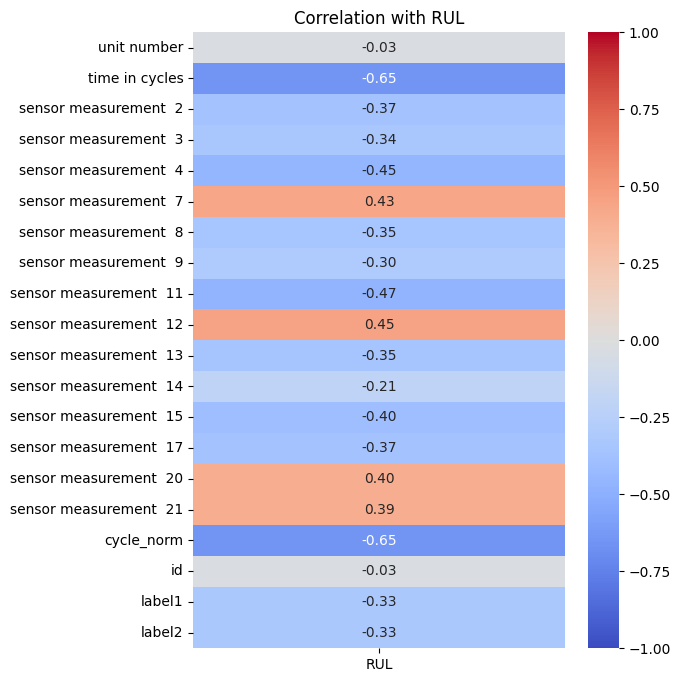

In [34]:
import seaborn as sns
# Define the output column name
output_column = 'RUL'

# Step 1: Calculate the correlation matrix
correlation_matrix = test_df.corr()

# Step 2: Extract only the correlations with the output column
correlation_with_target = correlation_matrix[[output_column]].drop(output_column)

# Step 3: Plot the correlation matrix using a heatmap
plt.figure(figsize=(6, 8))  # Set the figure size
sns.heatmap(correlation_with_target, annot=True, cmap='coolwarm', cbar=True, vmin=-1, vmax=1, fmt='.2f')
plt.title(f'Correlation with {output_column}')
plt.show()

In [35]:
# Define window size and sequence length
sequence_length = 30 # Replace with the desired sequence length

# Function to reshape features into (samples, time steps, features)
def generate_sequences(id_df, sequence_length, feature_columns):
    """Generate sequences from a dataframe for a given id.
    Sequences that are under the sequence length will be considered.
    We can also pad the sequences in order to use shorter ones."""
    data_matrix = id_df[feature_columns].values
    num_elements = data_matrix.shape[0]

    for start, end in zip(range(0, num_elements - sequence_length), range(sequence_length, num_elements)):
        yield data_matrix[start:end]  #Replace with the correct code to yield sequences of feature values



In [36]:
train_df.columns

Index(['unit number', 'time in cycles', 'sensor measurement  2',
       'sensor measurement  3', 'sensor measurement  4',
       'sensor measurement  7', 'sensor measurement  8',
       'sensor measurement  9', 'sensor measurement  11',
       'sensor measurement  12', 'sensor measurement  13',
       'sensor measurement  14', 'sensor measurement  15',
       'sensor measurement  17', 'sensor measurement  20',
       'sensor measurement  21', 'RUL', 'label1', 'label2', 'cycle_norm'],
      dtype='object')

In [37]:
train_df.columns

Index(['unit number', 'time in cycles', 'sensor measurement  2',
       'sensor measurement  3', 'sensor measurement  4',
       'sensor measurement  7', 'sensor measurement  8',
       'sensor measurement  9', 'sensor measurement  11',
       'sensor measurement  12', 'sensor measurement  13',
       'sensor measurement  14', 'sensor measurement  15',
       'sensor measurement  17', 'sensor measurement  20',
       'sensor measurement  21', 'RUL', 'label1', 'label2', 'cycle_norm'],
      dtype='object')

In [38]:
# Select feature columns for sequence generation (e.g., sensor readings, settings)
sensor_columns = [
    'sensor measurement  2',
    'sensor measurement  3',
    'sensor measurement  4',
    'sensor measurement  7',
    'sensor measurement  8',
    'sensor measurement  9',
    'sensor measurement  11',
    'sensor measurement  12',
    'sensor measurement  13',
    'sensor measurement  14',
    'sensor measurement  15',
    'sensor measurement  17',
    'sensor measurement  20',
    'sensor measurement  21'
] #Replace with the correct list of sensor column names

sequence_columns = [
    'sensor measurement  2',
    'sensor measurement  3',
    'sensor measurement  4',
    'sensor measurement  7',
    'sensor measurement  8',
    'sensor measurement  9',
    'sensor measurement  11',
    'sensor measurement  12',
    'sensor measurement  13',
    'sensor measurement  14',
    'sensor measurement  15',
    'sensor measurement  17',
    'sensor measurement  20',
    'sensor measurement  21',
    'cycle_norm'  
] #Replace with the correct list of sequence column names (including settings and sensors)

def generate_sequences(id_df, sequence_length, feature_columns):
    """Generate sequences from a dataframe for a given id."""
    data_matrix = id_df[feature_columns].values
    num_elements = data_matrix.shape[0]
    
    # Generate sequences using a sliding window
    for start, end in zip(range(0, num_elements - sequence_length + 1), range(sequence_length, num_elements + 1)):
        yield data_matrix[start:end, :]

# Corrected sequence generation
sequence_generator = []  # Collect sequences for all engines
for engine_id, engine_df in train_df.groupby('unit number'):
    # Create sequences for each engine
    if len(engine_df) >= sequence_length:  # Ensure there are enough cycles for the sequence length
        for sequence in generate_sequences(engine_df, sequence_length, sequence_columns):
            sequence_generator.append(sequence)

# Convert the sequences to a numpy array
sequence_array = np.array(sequence_generator)

def generate_labels(id_df, sequence_length, label_column='RUL'):
    """Generate labels for a given engine unit based on sequence length."""
    data_matrix = id_df[label_column].values
    num_elements = data_matrix.shape[0]
    
    # Generate labels for each sequence based on the specified sequence length
    labels = [[data_matrix[i + sequence_length - 1]] for i in range(num_elements - sequence_length + 1)]
    
    return labels 

# Corrected label generation
label_generator = []  # Collect labels for all engines
for engine_id, engine_df in train_df.groupby('unit number'):
    # Create labels for sequences by taking the RUL values
    if len(engine_df) >= sequence_length:  # Ensure enough data points for the sequence length
        labels = generate_labels(engine_df, sequence_length, label_column='label1')
        label_generator.extend(labels)

# Convert labels to numpy array
label_array = np.array(label_generator)

# Print shapes for debugging
print(f"Shape of sequence_array (features): {sequence_array.shape}")
print(f"Shape of label_array (labels): {label_array.shape}")


Shape of sequence_array (features): (17731, 30, 15)
Shape of label_array (labels): (17731, 1)


In [39]:
print(label_array)

[[0]
 [0]
 [0]
 ...
 [1]
 [1]
 [1]]


In [40]:
# Define the number of features and output units
nb_features = sequence_array.shape[2]
nb_out = label_array.shape[1]

# Create a Sequential model
model = Sequential()

# Add LSTM layers and Dropout layers to the model
# Note: Limit the total number of model parameters to 10,000
# Your code here:

model.add(LSTM(units=16, input_shape=(sequence_array.shape[1], len(sequence_columns)), return_sequences=True))
model.add(Dropout(0.2))
model.add(LSTM(units=8, return_sequences=False))
model.add(Dropout(0.2))

# Add a Dense output layer with sigmoid activation
model.add(Dense(units=nb_out, activation='sigmoid'))

# Compile the model with binary crossentropy loss and Adam optimizer
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

# Print the model summary
print(model.summary())

c:\Users\jyoti\OneDrive\Desktop\JYOTI CMU Docs\Applications of NLX & LLM\llm\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm (LSTM)                     │ (None, 30, 16)         │         2,048 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 30, 16)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_1 (LSTM)                   │ (None, 8)              │           800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 1)              │             9 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,857 (11.16 KB)

 Trainable params: 2,857 (11.16 KB)

 Non-trainable params: 0 (0.00 B)

None


In [41]:
train_df.head()

,unit number,time in cycles,sensor measurement 2,sensor measurement 3,sensor measurement 4,sensor measurement 7,sensor measurement 8,sensor measurement 9,sensor measurement 11,sensor measurement 12,sensor measurement 13,sensor measurement 14,sensor measurement 15,sensor measurement 17,sensor measurement 20,sensor measurement 21,RUL,label1,label2,cycle_norm
0,1,1,0.183735,0.406802,0.309757,0.726248,0.242424,0.109755,0.369048,0.633262,0.205882,0.199608,0.363986,0.333333,0.713178,0.724662,191,0,0,0.00000
1,1,2,0.283133,0.453019,0.352633,0.628019,0.212121,0.100242,0.380952,0.765458,0.279412,0.162813,0.411312,0.333333,0.666667,0.731014,190,0,0,0.00277
2,1,3,0.343373,0.369523,0.370527,0.710145,0.272727,0.140043,0.250000,0.795309,0.220588,0.171793,0.357445,0.166667,0.627907,0.621375,189,0,0,0.00554
3,1,4,0.343373,0.256159,0.331195,0.740741,0.318182,0.124518,0.166667,0.889126,0.294118,0.174889,0.166603,0.333333,0.573643,0.662386,188,0,0,0.00831
4,1,5,0.349398,0.257467,0.404625,0.668277,0.242424,0.149960,0.255952,0.746269,0.235294,0.174734,0.402078,0.416667,0.589147,0.704502,187,0,0,0.01108


In [42]:
history = model.fit(
    sequence_array,
    label_array,
    epochs=30,  # Number of training epochs
    batch_size=64,  # Batch size
    validation_split=0.2,  # Use 20% of the training data for validation
    verbose=1,  # Verbose level 1 to see detailed output
    callbacks=[
        # EarlyStopping callback to stop training when validation loss stops improving
        keras.callbacks.EarlyStopping(
            monitor='val_loss',
            min_delta=0.001,  # Minimum change to qualify as an improvement
            patience=5,  # Number of epochs to wait without improvement
            verbose=1,  # Verbose output for EarlyStopping
            mode='min'
        ),
        # ModelCheckpoint callback to save the best model based on validation loss
        keras.callbacks.ModelCheckpoint(
            "best_binary_classification_model.keras",  # Save the best model
            monitor='val_loss',
            save_best_only=True,
            mode='min',
            verbose=1  # Verbose output for ModelCheckpoint
        ),
        # ReduceLROnPlateau callback to reduce learning rate when validation loss plateaus
        keras.callbacks.ReduceLROnPlateau(
            monitor='val_loss',  # Monitor validation loss
            factor=0.5,  # Reduce learning rate by a factor of 0.5
            patience=3,  # Number of epochs to wait before reducing LR
            verbose=1,  # Verbose output
            min_lr=0.00001  # Lower bound on the learning rate
        )
    ]
)

Epoch 1/30
218/222 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.8539 - loss: 0.3869
Epoch 1: val_loss improved from inf to 0.15937, saving model to best_binary_classification_model.keras
222/222 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.8549 - loss: 0.3843 - val_accuracy: 0.9326 - val_loss: 0.1594 - learning_rate: 0.0010
Epoch 2/30
218/222 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.9470 - loss: 0.1486
Epoch 2: val_loss improved from 0.15937 to 0.10966, saving model to best_binary_classification_model.keras
222/222 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.9471 - loss: 0.1484 - val_accuracy: 0.9532 - val_loss: 0.1097 - learning_rate: 0.0010
Epoch 3/30
221/222 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.9563 - loss: 0.1132
Epoch 3: val_loss improved from 0.10966 to 0.08342, saving model to best_binary_classification_model.keras
222/222 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.9563 - loss: 0.1132 - val_accuracy: 0.9676 - val_loss: 0.0834 - learning_rate: 0.0

## Model Evaluation on Test set

In [43]:
print(f"Shape of sequence_array (features): {sequence_array.shape}")
print(f"Shape of label_array (labels): {label_array.shape}")

Shape of sequence_array (features): (17731, 30, 15)
Shape of label_array (labels): (17731, 1)


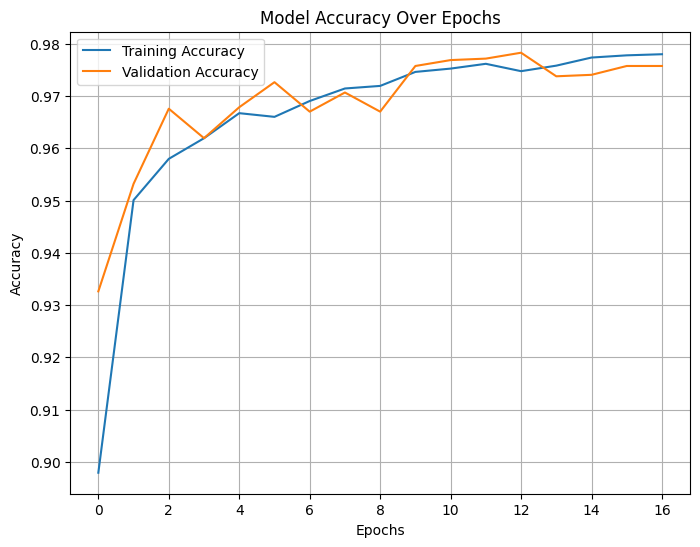

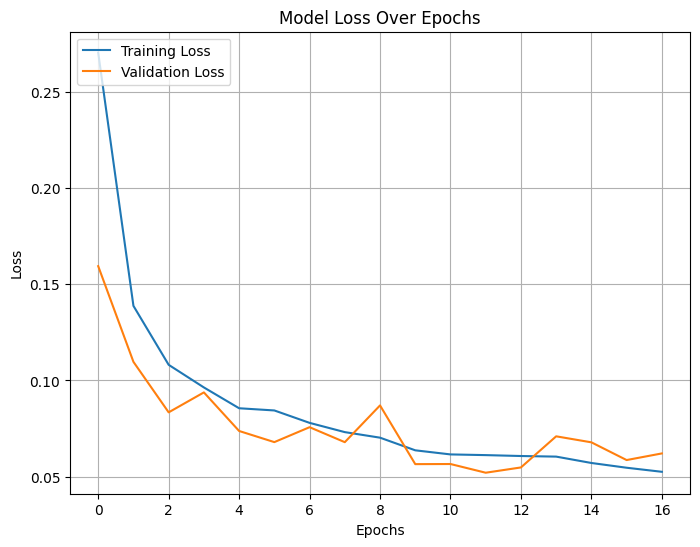

555/555 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.9800 - loss: 0.0444
Model Evaluation Scores on Training Data: [0.05058548226952553, 0.9786249995231628]
Training Loss: 0.05058548226952553
Training Accuracy: 0.9786249995231628
Plot saved to training_validation_loss.png


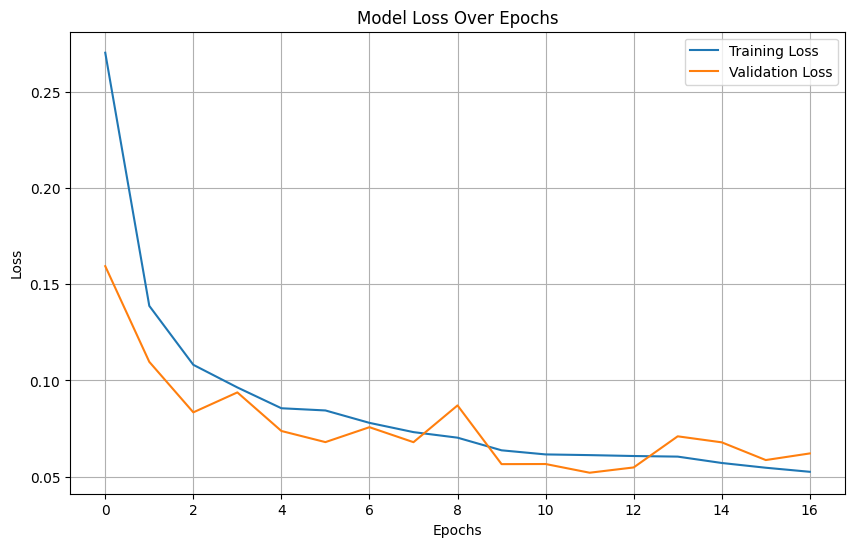

555/555 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.9800 - loss: 0.0444
Model Evaluation Scores on Training Data: [0.05058548226952553, 0.9786249995231628]
Training Loss: 0.05058548226952553
Training Accuracy: 0.9786249995231628
555/555 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
Training Accuracy: 0.9786


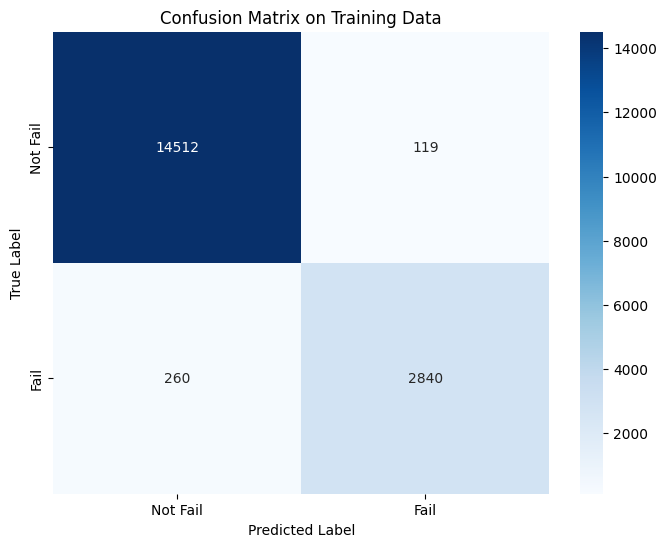


Classification Report:
              precision    recall  f1-score   support

    Not Fail       0.98      0.99      0.99     14631
        Fail       0.96      0.92      0.94      3100

    accuracy                           0.98     17731
   macro avg       0.97      0.95      0.96     17731
weighted avg       0.98      0.98      0.98     17731

Saved the predictions to 'predicted_labels.csv'.
Confusion matrix
- x-axis is true labels.
- y-axis is predicted labels
[[14512   119]
 [  260  2840]]
Confusion matrix
- x-axis is true labels.
- y-axis is predicted labels
precision =  0.9597837107130788 
 recall =  0.9161290322580645


In [44]:
import seaborn as sns

# summarize history for Accuracy
def plot_accuracy(history):
    # Extract accuracy values
    plt.figure(figsize=(8, 6))
    plt.plot(history.history['accuracy'], label='Training Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title('Model Accuracy Over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend(loc='upper left')
    plt.grid(True)
    plt.savefig('accuracy_plot.png')  # Save the plot to a file
    plt.show()

# Plot the training & validation accuracy over epochs and display the plot
def plot_loss(history):
    # Extract loss values
    plt.figure(figsize=(8, 6))
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Model Loss Over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend(loc='upper left')
    plt.grid(True)
    plt.savefig('loss_plot.png')  # Save the plot to a file
    plt.show()

# Call the plotting functions
plot_accuracy(history)
plot_loss(history)

# 3. Evaluate the model on the training data
# Use the evaluate method to calculate the accuracy and loss on the training data
scores = model.evaluate(sequence_array, label_array, verbose=1)
print(f"Model Evaluation Scores on Training Data: {scores}")

# Display the results
print(f"Training Loss: {scores[0]}")
if len(scores) > 1:
    print(f"Training Accuracy: {scores[1]}")



# summarize history for Loss
# Plot the training & validation loss over epochs and display the plot
# Save the plot to a file

def plot_and_save_loss(history, file_path="loss_plot.png"):
    """
    Plot the training and validation loss over epochs and save to a file.

    Parameters:
    history: History object from model training.
    file_path: The path where to save the loss plot.
    """
    # Extract loss values from the history object
    train_loss = history.history['loss']
    val_loss = history.history['val_loss']

    # Plot the training and validation loss over epochs
    plt.figure(figsize=(10, 6))
    plt.plot(train_loss, label='Training Loss')
    plt.plot(val_loss, label='Validation Loss')
    plt.title('Model Loss Over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)

    # Save the plot to a file
    plt.savefig(file_path)
    print(f"Plot saved to {file_path}")
    
    # Display the plot
    plt.show()

# Call the function to plot and save the loss
plot_and_save_loss(history, file_path="training_validation_loss.png")

# Use the evaluate method to calculate the accuracy of the model on the training data
scores = model.evaluate(sequence_array, label_array, verbose=1)
print(f"Model Evaluation Scores on Training Data: {scores}")

# Display the results
print(f"Training Loss: {scores[0]}")
if len(scores) > 1:
    print(f"Training Accuracy: {scores[1]}")

# Print the accuracy of the model on the training data

# make predictions and compute confusion matrix
# Use the predict method to make predictions on the training data
y_pred_prob = model.predict(sequence_array)
# Convert the predicted probabilities to class labels (e.g., using a threshold of 0.5)
y_pred = (y_pred_prob >= 0.5).astype(int) # Use predict and convert probabilities to class labels
y_true = label_array

from sklearn.metrics import confusion_matrix, accuracy_score, classification_report

accuracy = accuracy_score(y_true, y_pred)
print(f"Training Accuracy: {accuracy:.4f}")

conf_matrix = confusion_matrix(y_true, y_pred)

# Step 5: Display the confusion matrix using a heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap='Blues', xticklabels=['Not Fail', 'Fail'], yticklabels=['Not Fail', 'Fail'])
plt.title('Confusion Matrix on Training Data')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

# Step 6: Print a detailed classification report
report = classification_report(y_true, y_pred, target_names=['Not Fail', 'Fail'])
print("\nClassification Report:")
print(report)

# Create a Pandas DataFrame from the predicted labels and save it to a CSV file
test_set = test_set = pd.DataFrame({
    'True Label': y_true.flatten(),  # Flatten to ensure 1D array
    'Predicted Label': y_pred.flatten()
}) #Replace with the correct code to create a DataFrame from the predicted labels

# Save the DataFrame to a CSV file
test_set.to_csv("predicted_labels.csv", index=False)
print("Saved the predictions to 'predicted_labels.csv'.")

# Compute the confusion matrix
cm = confusion_matrix(y_true, y_pred) # Replace with the correct code to compute the confusion matrix

# Print the confusion matrix with explanation
print('Confusion matrix\n- x-axis is true labels.\n- y-axis is predicted labels')
print(cm) 
print('Confusion matrix\n- x-axis is true labels.\n- y-axis is predicted labels')


# Calculate the precision using precision_score and recall using recall_score from sklearn.metrics
precision = precision_score(y_true, y_pred) # Replace with the correct code to calculate precision
recall = recall_score(y_true, y_pred)#Replace with the correct code to calculate recall
print( 'precision = ', precision, '\n', 'recall = ', recall)

## Model Evaluation on Validation set

In [45]:
from sklearn.metrics import precision_score, recall_score, f1_score
# Pick the last sequence for each id in the test data
sequence_length = 30

# Using the existing `generate_sequences` function to extract only the last sequence for each engine
seq_array_test_last = []
for engine_id, engine_df in test_df.groupby('unit number'):
    # Generate all sequences for this engine using the existing function
    all_sequences = list(generate_sequences(engine_df, sequence_length, sequence_columns))
    
    # Append only the last sequence for this engine
    if all_sequences:  
        seq_array_test_last.append(all_sequences[-1])  # Pick the last sequence

# Convert the list of sequences to a numpy array
seq_array_test_last = np.array(seq_array_test_last)

# Print the shape to verify the format
print(f"Shape of seq_array_test_last: {seq_array_test_last.shape}")

 # Replace with code to select last sequence for each id

# Convert to numpy array and ensure float32 data type
seq_array_test_last = np.array(seq_array_test_last, dtype=np.float32)

# TODO: Pick the labels for the selected sequences
label_column = 'label1'  

# Create a mask to filter engines with sequences of length >= sequence_length
y_mask = test_df.groupby('unit number').size() >= sequence_length

# Filter the test DataFrame to get the last label for each engine with sufficient data
label_array_test_last = []

# Loop through each engine unit in the test data grouped by 'unit number'
for engine_id, engine_df in test_df.groupby('unit number'):
    if y_mask.loc[engine_id]:  # Only consider engines with enough data
        # Select the last label from the specified label column for this engine
        last_label = engine_df[label_column].values[-1]  # Use the last label as the representative label
        label_array_test_last.append(last_label)

# Convert to numpy array and ensure the correct shape and data type
label_array_test_last = np.array(label_array_test_last, dtype=np.float32)

# Reshape and ensure float32 data type
label_array_test_last = label_array_test_last.reshape(label_array_test_last.shape[0],1).astype(np.float32)

print(f"Shape of label_array_test_last: {label_array_test_last.shape}")
print(f"Data type of label_array_test_last: {label_array_test_last.dtype}")

#Load the saved model if it exists
model_path = "best_binary_classification_model.keras"  
# Load the saved model if it exists
if os.path.isfile(model_path):
    estimator = load_model(model_path)
    print(f"Model loaded successfully from: {model_path}")
else:
    print(f"Model file not found at: {model_path}")

if os.path.isfile(model_path):
    estimator = load_model(model_path)  # Replace with code to load the saved model

#Evaluate the model on the test data
scores_test = estimator.evaluate(seq_array_test_last, label_array_test_last, verbose=1)
print('Accuracy: {}'.format(scores_test[1]))

#Make predictions and compute confusion matrix
y_pred_prob_test = estimator.predict(seq_array_test_last)  # Get predicted probabilities
y_pred_test = (y_pred_prob_test >= 0.5).astype(int)  # Convert probabilities to 0 or 1
y_true_test = label_array_test_last

conf_matrix_test = confusion_matrix(y_true_test, y_pred_test)

# Print the confusion matrix
print("Confusion Matrix on Test Data:")
print(conf_matrix_test)

# Create pandas dataframe of y_pred_test and save predictions to CSV file
test_set = pd.DataFrame({
    'True Label': y_true_test.flatten(),  # Flatten to ensure 1D array
    'Predicted Label': y_pred_test.flatten()
})

test_set.to_csv("test_predictions.csv", index=False)
print("Predictions saved to 'test_predictions.csv'.")

#Compute confusion matrix
print('Confusion matrix\n- x-axis is true labels.\n- y-axis is predicted labels')
cm = confusion_matrix(y_true_test, y_pred_test) # Replace with code to compute confusion matrix
print(cm)

# Compute precision, recall, and F1-score
precision_test = precision_score(y_true_test, y_pred_test) # Replace with code to compute precision
recall_test = recall_score(y_true_test, y_pred_test) #Replace with code to compute recall
f1_test = f1_score(y_true_test, y_pred_test)# Replace with code to compute F1-score
print('Precision: ', precision_test, '\n', 'Recall: ', recall_test, '\n', 'F1-score:', f1_test)

# Plot predicted and actual data for visual verification


Shape of seq_array_test_last: (100, 30, 15)
Shape of label_array_test_last: (100, 1)
Data type of label_array_test_last: float32
Model loaded successfully from: best_binary_classification_model.keras
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.9694 - loss: 0.0833  
Accuracy: 0.9599999785423279
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 91ms/step
Confusion Matrix on Test Data:
[[74  1]
 [ 3 22]]
Predictions saved to 'test_predictions.csv'.
Confusion matrix
- x-axis is true labels.
- y-axis is predicted labels
[[74  1]
 [ 3 22]]
Precision:  0.9565217391304348 
 Recall:  0.88 
 F1-score: 0.9166666666666666


In [46]:
results_df = pd.DataFrame([[scores_test[1],precision_test,recall_test,f1_test],
                          [0.94, 0.952381, 0.8, 0.869565]],
                         columns = ['Accuracy', 'Precision', 'Recall', 'F1-score'],
                         index = ['LSTM',
                                 'Template Best Model'])
results_df

,Accuracy,Precision,Recall,F1-score
LSTM,0.96,0.956522,0.88,0.916667
Template Best Model,0.94,0.952381,0.80,0.869565
